In [1]:
# %% Import Python Libraries used for calculations.

import numpy as np
import sympy as sp

from matplotlib import rc
from matplotlib import cm
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

get_ipython().run_line_magic('matplotlib', 'inline')
get_ipython().run_line_magic('config', "InlineBackend.figure_format = 'retina'")
plt.rcParams.update({
    'xtick.major.size': 4,
    'ytick.major.size': 4,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'axes.titlesize': 16,
    'axes.labelsize': 16,
    'pdf.fonttype': 42,
    'font.family': 'Avenir',
    'font.size': 13,
    'xtick.direction': 'in',  # Set x-tick direction to 'in'
    'ytick.direction': 'in',  # Set y-tick direction to 'in'
    'xtick.major.size': 5,    # Set x-tick length
    'ytick.major.size': 5,    # Set y-tick length
    'xtick.major.pad': 6.5,   # Set x-tick padding
    'ytick.major.pad': 6.5    # Set y-tick padding
})

## Things for defining the mass balance

In [2]:
# %% 

# Define symbols
X_mf_init, X_FI_init = sp.symbols('X_mf_init X_FI_init')  # Initial mass fractions
S_mf_init, S_FI_init, Smass = sp.symbols('S_mf_init S_FI_init Smass')  # Initial compositions
S_mf_step, S_FI_step = sp.symbols('S_mf_step S_FI_step')  # Compositions at step
X_mf_step, X_FI_step, KD = sp.symbols('X_mf_step X_FI_step KD')  # End of step mass fraction and KD

# %%

# This says that the mass of the system is constant
mass_constant=sp.Eq(X_mf_init + X_FI_init, X_mf_step + X_FI_step)
# This writes a mass balance, but has subbsed in S_FI_step to S_mf_step
mass_balance=sp.Eq(X_mf_init * S_mf_init + X_FI_init * S_FI_init, X_mf_step * S_mf_step + X_FI_step * S_mf_step  * KD )
# Then we need to define how the system changes before and after
X_change=sp.Eq(X_mf_init-(S_mf_init*X_mf_init- S_mf_step*X_mf_step)/10**6, X_mf_step)

# Solve system of equations for S_mf_step, S_FI_step, and X_mf_step
solutions = sp.solve([mass_constant, mass_balance, X_change], (S_mf_step, X_mf_step, X_FI_step))

# Check the type of solutions
print("Solutions:")
print(solutions)

# If solutions are tuples, extract the S_mf_step component
if isinstance(solutions, list) and all(isinstance(sol, tuple) for sol in solutions):
    S_mf_step_solution = [sol[0] for sol in solutions]  # Extract first element (S_mf_step)
else:
    S_mf_step_solution = solutions[S_mf_step]  # Assume a dictionary output

print("S_mf_step solution:")
print(S_mf_step_solution)

# %%

# Function to get all roots for S_mf_step
def get_S_mf_step_roots(S_FI_init_val, S_mf_init_val, X_FI_init_val, X_mf_init_val, KD_val):
    # Define symbols
    S_FI_init, S_mf_init, X_FI_init, X_mf_init, KD = sp.symbols('S_FI_init S_mf_init X_FI_init X_mf_init KD')

    # Check if solutions are tuples
    if isinstance(solutions, list) and all(isinstance(sol, tuple) for sol in solutions):
        # Extract all S_mf_step solutions (first element of each tuple)
        S_mf_step_solution = [sol[0] for sol in solutions]  # First element of each tuple
    else:
        # For dictionary output (fallback if this happens)
        S_mf_step_solution = [solutions[S_mf_step]]
    
    # Create a dictionary to map input values to symbols
    subs_dict = {
        S_FI_init: S_FI_init_val,
        S_mf_init: S_mf_init_val,
        X_FI_init: X_FI_init_val,
        X_mf_init: X_mf_init_val,
        KD: KD_val
    }

    # Evaluate the solutions for S_mf_step
    evaluated_mf_steps = [sol.subs(subs_dict).evalf() for sol in S_mf_step_solution]
    
    return evaluated_mf_steps

# %%

# Assume `solutions` has been calculated using sp.solve()
mf_roots = get_S_mf_step_roots(S_FI_init_val=0, S_mf_init_val=1400, X_FI_init_val=0.5, X_mf_init_val=0.5, KD_val=70)

print("\nS_mf_step roots:")
for i, root in enumerate(mf_roots):
    print(f"Root {i + 1}: {root}")

# %%

def get_single_mf_root(S_FI_init_val, S_mf_init_val, X_FI_init_val, X_mf_init_val, KD_val):
    # Get all roots for S_mf_step
    mf_roots = get_S_mf_step_roots(S_FI_init_val, S_mf_init_val, X_FI_init_val, X_mf_init_val, KD_val)

    # Filter roots to those in the range (0, 1400)
    valid_roots = [root for root in mf_roots if 0 <= root <= 1400]


    # Check the number of valid roots
    if len(valid_roots) == 1:
        return valid_roots[0]  # Return the single valid root
    elif len(valid_roots) > 1:
        raise ValueError(f"Error: Multiple roots found in the range [0, 1400]: {valid_roots}")
    else:
        raise ValueError(f"Error: No valid root found in the range [0, 1400]: {mf_roots}")


# %%

test = get_single_mf_root(S_FI_init_val=0, S_mf_init_val=1400, X_FI_init_val=0.5, X_mf_init_val=0.5, KD_val=70)
test

# %%

def second_solve_step(X_mf_init, X_FI_init, S_mf_init, S_mf_step, S_FI_init, S_FI_step):
    # Define symbols
    X_mf_step, X_FI_step = sp.symbols('X_mf_step X_FI_step')

    # Define the equations
    mass_constant = sp.Eq(X_mf_init + X_FI_init, X_mf_step + X_FI_step)
    X_change = sp.Eq(X_mf_init - (S_mf_init * X_mf_init - S_mf_step * X_mf_step) / 10**6, X_mf_step)

    # Solve the equations
    solutions = sp.solve([mass_constant, X_change], (X_mf_step, X_FI_step))

    return solutions


# %%

test2 = second_solve_step(X_mf_init=0.5, X_FI_init=0.5, S_mf_init=1400, S_mf_step=test, S_FI_init=0, S_FI_step=test*KD)
test2


# %%

def solve_one_mass_balance_step(S_FI_init_val, S_mf_init_val, X_FI_init_val, X_mf_init_val, KD_val):
    # first use Sympy to solve the value for S_mf, as this has two roots. 
    S_mf_step_calc=get_single_mf_root(S_FI_init_val, S_mf_init_val, X_FI_init_val, X_mf_init_val, KD_val)

    # Then calculate S in the FI after that
    S_FI_step_calc=S_mf_step_calc*KD
    # Then calculate the new X_FI and X_mf_step prior to diffusion
    results=second_solve_step(X_mf_init=X_mf_init_val, X_FI_init=X_FI_init_val, S_mf_init= S_mf_init_val, S_mf_step=S_mf_step_calc, S_FI_init=S_FI_init_val, S_FI_step=S_FI_step_calc)
    X_FI_step_calc=results[X_FI_step]
    X_mf_step_calc=results[X_mf_step]

    return S_mf_step_calc, S_FI_step_calc,  X_FI_step_calc, X_mf_step_calc


Solutions:
[((KD*S_mf_init*X_mf_init + 1000000*KD*X_FI_init + S_FI_init*X_FI_init + 1000000*X_mf_init - sqrt(KD**2*S_mf_init**2*X_mf_init**2 + 2000000*KD**2*S_mf_init*X_FI_init*X_mf_init + 1000000000000*KD**2*X_FI_init**2 + 2*KD*S_FI_init*S_mf_init*X_FI_init*X_mf_init - 2000000*KD*S_FI_init*X_FI_init**2 - 4000000*KD*S_FI_init*X_FI_init*X_mf_init - 4000000*KD*S_mf_init*X_FI_init*X_mf_init - 2000000*KD*S_mf_init*X_mf_init**2 + 2000000000000*KD*X_FI_init*X_mf_init + S_FI_init**2*X_FI_init**2 + 2000000*S_FI_init*X_FI_init*X_mf_init + 1000000000000*X_mf_init**2))/(2*KD*(X_FI_init + X_mf_init)), (-KD*S_mf_init*X_mf_init + 1000000*KD*X_FI_init + 2000000*KD*X_mf_init - S_FI_init*X_FI_init - 1000000*X_mf_init - sqrt(KD**2*S_mf_init**2*X_mf_init**2 + 2000000*KD**2*S_mf_init*X_FI_init*X_mf_init + 1000000000000*KD**2*X_FI_init**2 + 2*KD*S_FI_init*S_mf_init*X_FI_init*X_mf_init - 2000000*KD*S_FI_init*X_FI_init**2 - 4000000*KD*S_FI_init*X_FI_init*X_mf_init - 4000000*KD*S_mf_init*X_FI_init*X_mf_init -

## Lets set up the geometry of the problem
- We consider a fluid inclusion.

In [3]:

def convert_s_ppm_to_so2_molperc(S_ppm):
    """
    Convert sulfur concentration (ppm) to SO2 mol% for scalar or array input.

    Parameters:
        S_ppm: Scalar or numpy array of sulfur concentrations in ppm.
    Returns:
        mol_frac_SO2: Scalar or numpy array of SO2 mol% values.
    """
    # Ensure input is a NumPy array for element-wise operations
    S_ppm = np.asarray(S_ppm)
    
    # Convert ppm to weight percent
    S_wt = S_ppm / 10**4
    # Calculate moles of S
    S_moles = S_wt / 32.065
    # Moles of O from SO2
    O_moles_from_SO2 = S_moles * 2
    # Oxygen weight contribution from SO2
    O_wt_from_SO2 = O_moles_from_SO2 * 16
    # Remaining mass as CO2
    mass_CO2 = 100 - S_wt - O_wt_from_SO2
    # Moles of CO2
    moles_CO2 = mass_CO2 / 44.009
    # Mole fraction of SO2
    mol_frac_SO2 = S_moles / (S_moles + moles_CO2)
    
    return 100*mol_frac_SO2


In [4]:
print('test', S_FI_init, S_mf_init, X_FI_init, X_mf_init, KD)

test S_FI_init S_mf_init X_FI_init X_mf_init KD


In [5]:
dr_test = 0.2*10**-6
D_test = 10**-12
radius_melt_test = 50*10**-6
radius_fluid_inclusion_test = 8*10**-6
radius_melt_film_test = dr_test
dt = (0.25 * dr_test**2) / D_test  # Time step size based on CFL condition

## Define masses of system here 
density_melt_test = 2700
density_FI_test = 160

# Calculate the mass of each in 3D this time
constant = 4/3 * np.pi
vol_FI_test = constant * radius_fluid_inclusion_test**3
vol_melt_test =constant * (radius_melt_film_test+radius_fluid_inclusion_test)**3 - vol_FI_test

mass_melt_all_test = density_melt_test*vol_melt_test
mass_FI_test = density_FI_test*vol_FI_test
mass_mf_init_test = mass_melt_all_test
KD=100

S_FI_init_test = 0
S_melt_init_test = 1400
mass_FI_test = mass_FI_test
mass_mf_init_test = 1400

S_mf_initial, S_FI_initial, X_FI_initial, X_mf_initial = solve_one_mass_balance_step(
    S_FI_init_val=S_FI_init_test, 
    S_mf_init_val=S_melt_init_test,
    X_FI_init_val=mass_FI_test, 
    X_mf_init_val=mass_mf_init_test,
    KD_val=KD
)

In [ ]:
def run_diffusion_spherical(dr, D, radius_melt, radius_fluid_inclusion,
                            S_melt_init, S_FI_init,
                            KD, total_time=600, save_interval=1):
    """
    Simulate sulfur diffusion in spherical coordinates with a fluid inclusion and mass balance.

    Parameters:
        dr : step size (m)
        D (float): Diffusivity (m^2/s).
        radius_melt (float): Radius of the melt (m).
        radius_melt_film (float): Radius of the melt film (m).
        radius_fluid_inclusion (float): Radius of the spherical fluid inclusion (m).
        S_melt_init (float): Initial sulfur concentration in the melt / melt film (ppm).
        S_FI_init (float): Initial sulfur concentration in the fluid inclusion (ppm).
        mass_FI (float): Mass of the fluid inclusion (kg).
        mass_melt (float): Mass of the melt film (kg).
        KD (float): Partition coefficient.
        total_time (float): Total simulation time in seconds (default: 600s).
    """
    
    ### Setup grid and initial parameters
    
    radius_melt_film = dr
    total_radius = (radius_melt + radius_melt_film + radius_fluid_inclusion)
    r = np.arange(0, total_radius + dr, dr)  # Radial grid
    Nr = len(r)  # Number of radial points
    dt = (0.25 * dr**2) / D  # Time step size based on CFL condition
    time_steps = int(total_time / dt)  # Number of time steps
    save_interval = save_interval  # Frequency of saving the results

    # Define density 
    density_melt = 2700 # kg/m^3
    density_FI = 160 # kg/m^3

    # Calculate the mass of these elements in 3D
    constant = 4/3 * np.pi
    volume_FI = constant * radius_fluid_inclusion**3
    surface_FI = constant * 3 * radius_fluid_inclusion**2 
    volume_melt = constant * (radius_melt_film+radius_fluid_inclusion)**3 - volume_FI

    mass_melt_all = density_melt * volume_melt
    mass_FI = density_FI * volume_FI
    mass_SO2 = 0.0 # initial mass of S in the system
    mass_mf_init = mass_melt_all

    # Initialize concentration array
    C = np.full(Nr, S_melt_init, dtype=float)  # Initial concentration in melt

    ### Initial mass balance
    S_mf_initial, S_FI_initial, X_FI_initial, X_mf_initial = solve_one_mass_balance_step(
        S_FI_init_val=S_FI_init, 
        S_mf_init_val=S_melt_init,
        X_FI_init_val=mass_FI, 
        X_mf_init_val=mass_mf_init,
        KD_val=KD
    )

    print('Initial mass balance completed')

    #print('Initial:', round(S_mf_initial, 4), round(S_FI_initial, 4), X_FI_initial, X_mf_initial)

    ### Define masks for geometry
    fluid_inclusion_mask = r <= radius_fluid_inclusion
    melt_film_mask = (r > radius_fluid_inclusion) & (r <= radius_fluid_inclusion + radius_melt_film)
    melt_mask = r > radius_fluid_inclusion + radius_melt_film
    interface_index = np.argmax(r > radius_fluid_inclusion)
    
    C[fluid_inclusion_mask] = 0.0 #S_FI_initial  # Initial concentration in fluid inclusion r <= radius_fluid_inclusion
    C[melt_film_mask] = S_melt_init #S_mf_initial  # Melt film is set to the mass balance value (~65.94 ppm)

    ### Initialize storage for outputs
    C_profile = np.zeros((time_steps // save_interval + 1, Nr))
    C_profile[0, :] = C
    S_FI_over_time = np.zeros(time_steps)
    S_mf_over_time = np.zeros(time_steps)

    print(time_steps)
    ### Diffusion and mass balance loop
    for t in range(time_steps):
        
        if t==0:
            S_FI_step_prior=0.0
        else:
            S_FI_step_prior=S_FI_step_calc

        try:
            # Update diffusion in spherical coordinates
            C_new = C.copy()
            for i in range(1, Nr - 1):  # Skip boundaries
                if i == interface_index:
                    # The grid cell i is the first point in the melt

                    # first calculate flux across the boundary
                    J = D*(C[i] - S_FI_step_prior/KD)/dr

                    # Calculate S loss from the melt film due to flux into the fluid
                    dS = -(J*surface_FI*dt)/(volume_melt) # change in melt conc due to loss to the bubble, in ppm 

                    # combine this with Fick's second law to calculate change in the melt film concentration
                    dC_dr = (C[i+1] - C[i]) / dr
                    d2C_dr2 = (C[i+1] - C[i]) / dr**2
                    C_new[i] = C[i] + D * dt * (d2C_dr2 + (2 / r[i]) * dC_dr) + dS
                    # C_new[i] = C[i] + (D*dt/(r[i]**2*dr**2))*(r[i+1]**2*(C[i+1]-C[i])) + dS

                    print(f"melt film {C_new[i]}")

                    # calculate true mass transfer to the fluid (ds) accounting for differences in densities
                    dS_fluid = -dS*volume_melt*density_melt*10**(-6)

                    print(f"mass transfer {dS_fluid}")

                    # work out new masses of FI and SO2 in FI
                    mass_FI = mass_FI + 2*dS_fluid # adding the mass of SO2 to the fluid
                    mass_SO2 = mass_SO2 + 2*dS_fluid

                    # calculate S content in ppm
                    S_FI_step_calc = ((0.5*mass_SO2)/mass_FI)*10**6

                else:
                    # For all other points use the central difference.
                    dC_dr = (C[i+1] - C[i-1]) / (2*dr)
                    d2C_dr2 = (C[i+1] - 2 * C[i] + C[i-1]) / dr**2
                    C_new[i] = C[i] + D * dt * (d2C_dr2 + (2 / r[i]) * dC_dr)
                    # C_new[i] = C[i] + (D*dt/(r[i]**2*dr**2))*(r[i+1]**2*(C[i+1]-C[i]) - r[i-1]**2*(C[i] - C[i-1]))

            # Apply boundary conditions
            C_new[0] = C_new[1]  # Symmetry condition at r = 0
            C_new[-1] = C_new[-2]  # No-flux condition at outer boundary
            C = C_new

            # Compute average sulfur concentration in the melt film
            S_mf_diffusion = np.mean(C[melt_film_mask])  # Average S in melt film

            print('S in melt film=', round(S_mf_diffusion, 4), 'S in F inc=', round(S_FI_step_calc))

            # Update sulfur concentrations
            S_FI_over_time[t] = S_FI_step_calc  # Track sulfur in the fluid inclusion
            S_mf_over_time[t] = S_mf_diffusion  # Track sulfur in the melt film
            C[fluid_inclusion_mask] = S_FI_step_calc  # Update fluid inclusion concentration
            # C[melt_film_mask] = S_mf_new

            # Save the concentration profile at intervals
            if t % save_interval == 0:
                C_profile[t // save_interval, :] = C

        except ValueError as e:
            # Save partial results and break
            print(f"Error at time {t * dt} seconds: {e}")
            break

    ### Return results even if terminated early
    return C_profile[:t // save_interval + 1], S_FI_over_time[:t], S_mf_over_time[:t], dr, dt, save_interval


In [7]:
# %% Parameters

dr = 0.2*1e-6
D = 1e-12  # Diffusivity (m^2/s)
radius_melt = 200*1e-6  # Radius of the melt (m)
radius_fluid_inclusion = 8*1e-6  # Radius of the fluid inclusion (m)
S_melt_init = 1400  # Sulfur concentration in the melt (ppm)
S_FI_init = 0 # Sulfur concentration in the fluid inclusion (ppm)
total_radius = (radius_melt + dr + radius_fluid_inclusion)


C_profile, S_FI_over_time, S_mf_over_time, dr, dt, save_interval = run_diffusion_spherical(dr=dr, D=D, radius_melt=radius_melt, radius_fluid_inclusion=radius_fluid_inclusion,
                                                                                           S_melt_init=S_melt_init, S_FI_init=S_FI_init,  
                                                                                           KD=KD, total_time=1200)


Initial mass balance completed
120000
melt film 1058.6059743954477
mass transfer 1.5200281895128855e-16
S in melt film= 1058.606 S in F inc= 443
melt film 891.0529476651997
mass transfer 1.1445597376825072e-16
S in melt film= 891.0529 S in F inc= 775
melt film 787.2560304007097
mass transfer 9.590290067696812e-17
S in melt film= 787.256 S in F inc= 1054
melt film 715.0203924713534
mass transfer 8.433097837298904e-17
S in melt film= 715.0204 S in F inc= 1298
melt film 661.1068507307514
mass transfer 7.622253181571674e-17
S in melt film= 661.1069 S in F inc= 1519
melt film 618.9425991501935
mass transfer 7.012913732897206e-17
S in melt film= 618.9426 S in F inc= 1722
melt film 584.8448582275669
mass transfer 6.533076266435975e-17
S in melt film= 584.8449 S in F inc= 1911
melt film 556.56789971838
mass transfer 6.142344244047627e-17
S in melt film= 556.5679 S in F inc= 2089
melt film 532.6537164189069
mass transfer 5.816051986498843e-17
S in melt film= 532.6537 S in F inc= 2257
melt film 

In [8]:
import os

# Create the directory if it doesn't exist
os.makedirs('results', exist_ok=True)
np.savez(f'results/spherical_C_profile_dr{dr}_MattNew.npz', C_profile=C_profile, S_FI_over_time=S_FI_over_time, S_mf_over_time=S_mf_over_time, dr=dr, dt=dt, save_interval=save_interval)
np.savez(f'results/spherical_S_results_dr{dr}_MattNew.npz', S_FI_over_time=S_FI_over_time, S_mf_over_time=S_mf_over_time, dr=dr, dt=dt, save_interval=save_interval)

In [9]:
from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec

def animate_diffusion_full_cross_section(C_profile, C_profile_molperc, r, dt, save_interval,
                                         radius_fluid_inclusion,
                                         save_path='results/diffusion_full_cross_section.gif', 
                                         frame_step=25):
    """
    Create an animation of sulfur diffusion with a full 2D cross-section (XZ-plane)
    and a 1D transect. The two subplots will be of equal size, and the two colorbars 
    on the 2D subplot will span the same vertical height as the 2D axes.
    
    Parameters:
        C_profile (numpy.ndarray): Concentration profile over time (ppm).
        C_profile_molperc (numpy.ndarray): Concentration profile over time in mol% for the fluid inclusion.
        r (numpy.ndarray): Radial grid (1D array).
        dt (float): Time step size.
        save_interval (int): Interval for saving the results.
        radius_fluid_inclusion (float): Radius of the fluid inclusion.
        save_path (str): Path to save the animation as a GIF.
        frame_step (int): Subsampling rate for the time frames.
    """

    # Subsample the time steps
    frame_step = frame_step
    frames = range(0, C_profile.shape[0], frame_step)

    # Create a figure with two equally sized subplots using GridSpec.
    fig = plt.figure(figsize=(15, 5))
    gs = gridspec.GridSpec(1, 2, figure=fig, width_ratios=[1, 1])
    gs.update(wspace=0.4)  # Increase horizontal spacing between subplots
    
    # Left subplot: 1D radial transect.
    ax1 = fig.add_subplot(gs[0])
    # Right subplot: 2D cross-section.
    ax2 = fig.add_subplot(gs[1])
    
    # -----------------------------
    # 1D Radial Transect Setup
    # -----------------------------
    # Create a twin y-axis so that we can plot two different datasets.
    ax1_twin = ax1.twinx()
    
    # Mask the fluid inclusion region in C_profile with NaN
    fluid_inclusion_mask = r <= radius_fluid_inclusion  # Mask for the fluid inclusion region
    C_profile_masked = np.copy(C_profile)
    C_profile_masked[:, fluid_inclusion_mask] = np.nan  # Mask fluid inclusion region

    # Mask the melt region in C_profile_molperc with NaN
    C_profile_molperc_masked = np.copy(C_profile_molperc)
    C_profile_molperc_masked[:, ~fluid_inclusion_mask] = np.nan  # Mask melt region

    # Plot the full profile (red line).
    line1, = ax1.plot(r * 1e6, C_profile_masked[0, :], label='S (ppm)', color='#E42211')

    # Plot the fluid inclusion profile (blue dashed line) on the twin axis.
    line2, = ax1_twin.plot(r * 1e6, C_profile_molperc_masked[0, :], label='$\\mathregular{{S_{{FI}}}}$ (mol%)', 
                           color='#0A306B', linestyle='--', linewidth=3)
    
    ax1.set_xlabel('Radius (µm)')
    ax1.set_ylabel('S (ppm)', color='#E42211')
    ax1_twin.set_ylabel('$\\mathregular{{S_{{FI}}}}$ (mol%)', color='#0A306B')
    ax1.set_title('1D Radial Transect')
    ax1.set_xlim([0, r[-1]*1e6])
    ax1.set_ylim([np.nanmin(C_profile_masked)*0.975, np.nanmax(C_profile_masked)*1.125])
    ax1_twin.set_ylim([0, np.nanmax(C_profile_molperc_masked)*1.125])
    ax1.grid()
    
    # Add legends; you may adjust the locations as needed.
    ax1.legend(loc='lower center', fontsize=10)
    ax1_twin.legend(loc='lower right', fontsize=10)
    
    # -----------------------------
    # 2D Cross-Section Setup (XZ-plane)
    # -----------------------------
    # Create a grid for the 2D plot.
    x = np.linspace(-r[-1], r[-1], 200)
    z = np.linspace(-r[-1], r[-1], 200)
    X, Z = np.meshgrid(x, z)
    R = np.sqrt(X**2 + Z**2)
    
    # Map the 1D concentration profile (melt, ppm) to the 2D grid.
    C_2D = np.interp(R.flatten(), r, C_profile_masked[0, :]).reshape(X.shape)
    # Map the fluid inclusion (mol%) data to the 2D grid.
    C_FI_2D = np.interp(R.flatten(), r, C_profile_molperc_masked[0, :]).reshape(X.shape)
    
    # Plot the melt concentration using imshow.
    im1 = ax2.imshow(C_2D, 
                     extent=(-r[-1]*1e6, r[-1]*1e6, -r[-1]*1e6, r[-1]*1e6),
                     origin='lower', cmap='Reds', 
                     vmin=0, vmax=np.nanmax(C_profile_masked))

    # Use an axes divider to create colorbar axes that match the vertical height of ax2.
    divider = make_axes_locatable(ax2)
    # Create the first colorbar axis (for the melt data) to the right of ax2.
    cax1 = divider.append_axes("right", size="5%", pad=0.075)
    cbar1 = plt.colorbar(im1, cax=cax1)
    cbar1.ax.tick_params(labelsize=10, pad=3)  # set tick label size for the first colorbar
    cbar1.ax.set_title('$\\mathregular{{S_{{melt}}}}$\n(ppm)', fontsize=10)
    
    # Plot the fluid inclusion concentration overlay.
    im2 = ax2.imshow(C_FI_2D, 
                     extent=(-r[-1]*1e6, r[-1]*1e6, -r[-1]*1e6, r[-1]*1e6),
                     origin='lower', cmap='Blues',
                     vmin=0, vmax=np.nanmax(C_profile_molperc_masked))
    # Create a second colorbar axis for the fluid inclusion data.
    cax2 = divider.append_axes("right", size="5%", pad=0.45)
    cbar2 = plt.colorbar(im2, cax=cax2)
    cbar2.ax.tick_params(labelsize=10, pad=3)  # set tick label size for the first colorbar
    cbar2.ax.set_title('$\\mathregular{{S_{{FI}}}}$\n(mol%)', fontsize=10)
    
    ax2.set_title('2D Cross-Section')
    ax2.set_xlabel('X-Y-Z Axis (µm)')
    ax2.set_ylabel('X-Y-Z Axis (µm)')
    
    # -----------------------------
    # Update function for the animation
    # -----------------------------
    def update(frame):
        # Update 1D transect.
        line1.set_ydata(C_profile_masked[frame, :])
        line2.set_ydata(C_profile_molperc_masked[frame, :])
        
        # Update the 2D images.
        C_2D = np.interp(R.flatten(), r, C_profile_masked[frame, :]).reshape(X.shape)
        im1.set_data(C_2D)
        C_FI_2D = np.interp(R.flatten(), r, C_profile_molperc_masked[frame, :]).reshape(X.shape)
        im2.set_data(C_FI_2D)
        
        # Update titles with current time.
        ax1.set_title(f'1D Radial Transect, t={frame * dt * save_interval:.3f}s')
        ax2.set_title(f'2D Cross-Section, $\\mathregular{{S_{{FI}}}}$={np.round(np.nanmax(C_profile_molperc_masked[frame, :]), 4)} mol%')
        return line1, line2, im1, im2
    
    # Create the animation.
    anim = FuncAnimation(fig, update, frames=frames, interval=50, blit=False)
    
    # Save the animation.
    anim.save(save_path, writer='pillow', fps=10)
    print(f'Animation saved to {save_path}')
    
    plt.show()


Animation saved to results/diffusion_full_cross_section_2e-07_MattNew.gif


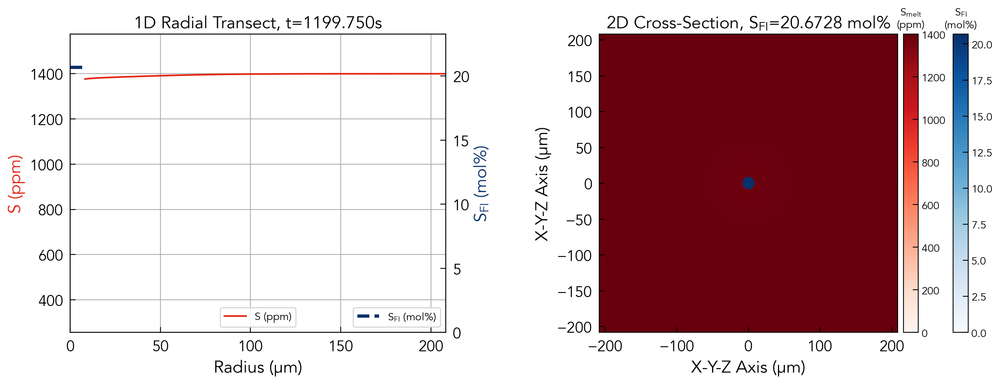

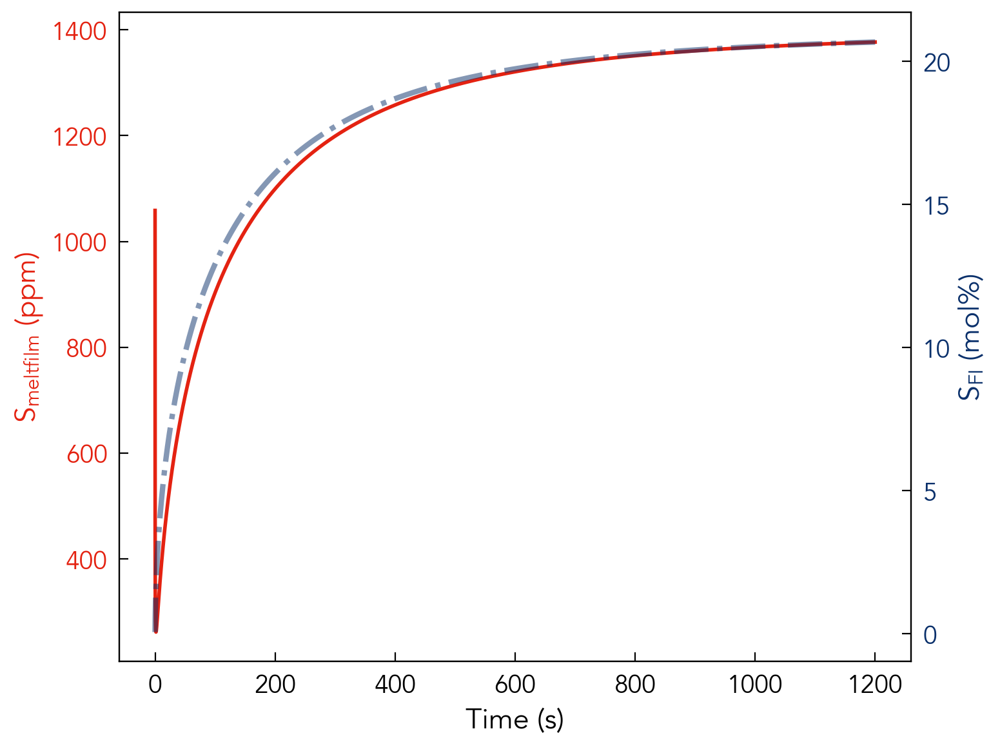

In [11]:
C_profile_molperc = np.copy(C_profile)  # Create a copy of C_profile
r = np.arange(0, total_radius + dr, dr)  # Radial grid
fluid_inclusion_mask = r <= radius_fluid_inclusion  # Mask for the fluid inclusion region
C_profile_molperc[:, fluid_inclusion_mask] = convert_s_ppm_to_so2_molperc(C_profile[:, fluid_inclusion_mask])

# # animate_diffusion_full_cross_section(C_profile, r, dt, save_path='diffusion_full_cross_section.gif')
animate_diffusion_full_cross_section(C_profile, C_profile_molperc, r, dt, save_interval, radius_fluid_inclusion, 
                                     save_path=f"results/diffusion_full_cross_section_{dr}_MattNew.gif")

# # Create a time axis (in seconds) that matches S_FI_over_time.
time_array = np.arange(len(S_FI_over_time)) * dt
S_FI_over_time_molperc = convert_s_ppm_to_so2_molperc(S_FI_over_time)

fig, ax1 = plt.subplots(figsize=(8, 6))
# # Primary y-axis for S_mf (ppm)
ax1.plot(time_array, S_mf_over_time, lw=2, label='Sulfur in Melt Film (ppm)', color='#E42211')
ax1.set_xlabel('Time (s)')
ax1.set_ylabel('$\\mathregular{{S_{{melt film}}}}$ (ppm)', color='#E42211')
ax1.tick_params(axis='y', labelcolor='#E42211')

# Secondary y-axis for S_FI (mol%)
ax2 = ax1.twinx()
ax2.plot(time_array, S_FI_over_time_molperc, ls='-.', lw=3, label='Sulfur in Fluid Inclusion (mol%)', color='#0A306B', alpha=0.5)
ax2.set_ylabel('$\\mathregular{{S_{{FI}}}}$ (mol%)', color='#0A306B')
ax2.tick_params(axis='y', labelcolor='#0A306B')
fig.tight_layout()
plt.savefig(f"results/diffusion_over_time_{dr}_MattNew.pdf")
plt.show()

In [34]:
C_profile[:, ~fluid_inclusion_mask]

array([[1058.6059744 , 1400.        , 1400.        , ..., 1400.        ,
        1400.        , 1400.        ],
       [ 891.05294767, 1316.68360089, 1400.        , ..., 1400.        ,
        1400.        , 1400.        ],
       [ 787.2560304 , 1234.1344841 , 1379.65529789, ..., 1400.        ,
        1400.        , 1400.        ],
       ...,
       [1376.77833516, 1376.98947806, 1377.19222477, ..., 1399.96882128,
        1399.98443954, 1400.        ],
       [1376.77870465, 1376.98984264, 1377.19258464, ..., 1399.96882126,
        1399.98443952, 1400.        ],
       [1376.77907413, 1376.99020721, 1377.1929445 , ..., 1399.96882123,
        1399.98443951, 1400.        ]])